## All Together Model

In [ ]:
# Create transform function
transforms_train = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(), # data augmentation
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # normalization
])
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
     transforms.CenterCrop((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [ ]:
good_train_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/alltogether_model/train'
good_val_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/alltogether_model/val'
good_test_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/alltogether_model/test'

In [ ]:
# Apply for training and test data
train_dataset = datasets.ImageFolder(good_train_dir, transforms_train)
val_dataset = datasets.ImageFolder(good_val_dir, transforms_test)
test_dataset = datasets.ImageFolder(good_test_dir, transforms_test)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=12, shuffle=True, num_workers=0)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=12, shuffle=False, num_workers=0)
real_test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=12, shuffle=False, num_workers=0)

In [ ]:
print('Train dataset size:', len(train_dataset))
print('Validation dataset size:', len(val_dataset))
class_names = train_dataset.classes
print('Class names:', class_names)

Train dataset size: 243
Validation dataset size: 62
Class names: ['Good', 'not_Good']


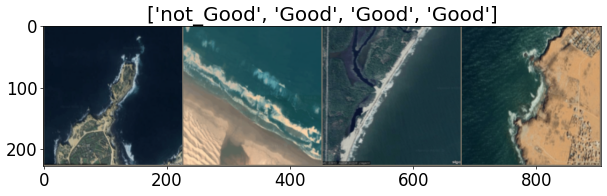

In [ ]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})
def imshow(input, title):
    # torch.Tensor => numpy
    input = input.numpy().transpose((1, 2, 0))
    # undo image normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input = std * input + mean
    input = np.clip(input, 0, 1)
    # display images
    plt.imshow(input)
    plt.title(title)
    plt.show()
# load a batch of train image
iterator = iter(train_dataloader)
# visualize a batch of train image
inputs, classes = next(iterator)
out = torchvision.utils.make_grid(inputs[:4])
imshow(out, title=[class_names[x] for x in classes[:4]])

### Checking that the Data is Balanced

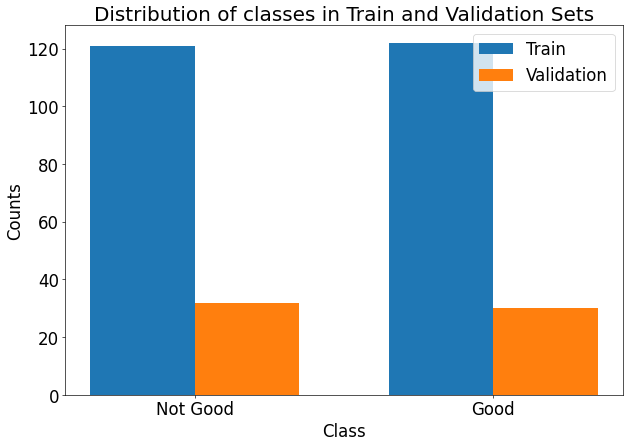

In [ ]:
def get_labels(dataloader):
    labels = []
    for _, cls in dataloader:
        labels.extend(cls.numpy())
    return labels

train_labels = get_labels(train_dataloader)
val_labels = get_labels(val_dataloader)

from collections import Counter

train_label_counts = Counter(train_labels)
val_label_counts = Counter(val_labels)

import matplotlib.pyplot as plt

# Configure plot settings
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})

def plot_value_counts(train_counts, val_counts, class_names):
    # Prepare data
    classes = list(class_names.values())  # Assuming class_names is a dict mapping indices to class names
    train_values = [train_counts.get(i, 0) for i in range(len(classes))]
    val_values = [val_counts.get(i, 0) for i in range(len(classes))]

    # Creating subplots
    fig, ax = plt.subplots()
    index = range(len(classes))
    bar_width = 0.35

    train_bar = ax.bar(index, train_values, bar_width, label='Train')
    val_bar = ax.bar([p + bar_width for p in index], val_values, bar_width, label='Validation')

    ax.set_xlabel('Class')
    ax.set_ylabel('Counts')
    ax.set_title('Distribution of classes in Train and Validation Sets')
    ax.set_xticks([p + bar_width / 2 for p in index])
    ax.set_xticklabels(classes)
    ax.legend()

    plt.show()

# Assuming 'class_names' is a dict mapping label indices to names, like {0: 'Class0', 1: 'Class1', ...}
class_names = {0: 'Not Good', 1: 'Good'}
plot_value_counts(train_label_counts, val_label_counts, class_names)


In [ ]:
# model30epoch = models.resnet50(pretrained=True)
modelgood = models.resnet50(pretrained=True)


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 102MB/s]


In [ ]:
num_features = modelgood.fc.in_features
print('Number of features from pre-trained model', num_features)

Number of features from pre-trained model 2048


In [ ]:

# Replace the fully-connected layer with a new one with a single output
# model.fc = nn.Linear(num_features, 1)

# Optionally, you can add a sigmoid activation right here in the model definition,
# but typically it's applied via the loss during training or post-processing during inference
modelgood.fc = nn.Linear(num_features, 2)


# If you have a specific device (e.g., GPU) set up

modelgood = modelgood.to(device)


In [ ]:
# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(modelgood.parameters(), lr=0.0001, momentum=0.9)

In [ ]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

In [ ]:
import time
import torch

def train_and_validate_model(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs, device):
    # Start time recording
    start_time = time.time()

    # Initialize lists for storing metrics
    train_loss = []
    train_accuracy = []
    val_loss = []
    val_accuracy = []

    # Loop for every epoch
    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1} running")

        """ Training Phase """
        model.train()  # Set model to training mode
        running_loss = 0.0
        running_corrects = 0

        # Iterate over data.
        for inputs, labels in train_dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # Backward + optimize
            loss.backward()
            optimizer.step()

            # Statistics
            running_loss += loss.item() * inputs.size(0)  # Multiply by batch size
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_dataloader.dataset)
        epoch_acc = running_corrects.double() / len(train_dataloader.dataset) * 100

        # Store metrics
        train_loss.append(epoch_loss)
        train_accuracy.append(epoch_acc)

        # Print training progress
        print(f'[Train] Epoch: {epoch+1}/{num_epochs} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.2f}% Time: {time.time() - start_time:.4f}s')

        """ Validation Phase """
        model.eval()  # Set model to evaluate mode
        running_loss = 0.0
        running_corrects = 0

        with torch.no_grad():
            for inputs, labels in val_dataloader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                # Statistics
                running_loss += loss.item() * inputs.size(0)  # Multiply by batch size
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(val_dataloader.dataset)
            epoch_acc = running_corrects.double() / len(val_dataloader.dataset) * 100

            # Store metrics
            val_loss.append(epoch_loss)
            val_accuracy.append(epoch_acc)

            # Print validation progress
            print(f'[Validation] Epoch: {epoch+1}/{num_epochs} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.2f}% Time: {time.time() - start_time:.4f}s')

    return train_loss, train_accuracy, val_loss, val_accuracy



In [ ]:

modelgood = modelgood.to(device)

train_loss, train_accuracy, val_loss, val_accuracy = train_and_validate_model(
    modelgood, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=70, device=device)


Epoch 1 running
[Train] Epoch: 1/70 Loss: 0.7160 Acc: 41.56% Time: 7.6592s
[Validation] Epoch: 1/70 Loss: 0.7002 Acc: 51.61% Time: 8.6630s
Epoch 2 running
[Train] Epoch: 2/70 Loss: 0.7116 Acc: 49.38% Time: 14.7539s
[Validation] Epoch: 2/70 Loss: 0.6887 Acc: 54.84% Time: 15.7147s
Epoch 3 running
[Train] Epoch: 3/70 Loss: 0.6929 Acc: 49.38% Time: 22.5833s
[Validation] Epoch: 3/70 Loss: 0.6842 Acc: 51.61% Time: 23.5174s
Epoch 4 running
[Train] Epoch: 4/70 Loss: 0.6720 Acc: 56.79% Time: 29.5489s
[Validation] Epoch: 4/70 Loss: 0.6737 Acc: 56.45% Time: 30.6366s
Epoch 5 running
[Train] Epoch: 5/70 Loss: 0.6622 Acc: 61.73% Time: 37.4436s
[Validation] Epoch: 5/70 Loss: 0.6686 Acc: 59.68% Time: 38.3934s
Epoch 6 running
[Train] Epoch: 6/70 Loss: 0.6648 Acc: 58.44% Time: 44.4545s
[Validation] Epoch: 6/70 Loss: 0.6690 Acc: 56.45% Time: 45.6944s
Epoch 7 running
[Train] Epoch: 7/70 Loss: 0.6458 Acc: 65.02% Time: 52.1350s
[Validation] Epoch: 7/70 Loss: 0.6637 Acc: 61.29% Time: 53.0841s
Epoch 8 running

###Eval

In [ ]:
num_epochs=70

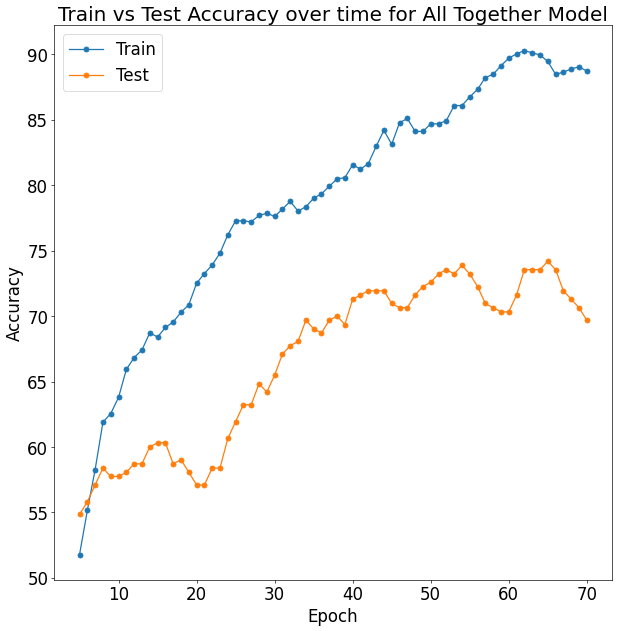

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Assuming train_accuracy and val_accuracy are lists or numpy arrays
# Example: train_accuracy = np.array([...]), val_accuracy = np.array([...])

# Convert to numpy arrays if they are lists
train_accuracy_cpu = [x.item() for x in train_accuracy]
val_accuracy_cpu = [x.item() for x in val_accuracy]

# Apply moving average with a window size of 5 (you can adjust the window size)
window_size = 5
smoothed_train_accuracy = moving_average(train_accuracy_cpu, window_size)
smoothed_val_accuracy = moving_average(val_accuracy_cpu, window_size)

# Adjust the x-axis to match the length of the smoothed data
epochs = np.arange(1, num_epochs + 1)
smoothed_epochs = epochs[window_size - 1:]

# Plot
plt.figure(figsize=(12, 12))
plt.plot(smoothed_epochs, smoothed_train_accuracy, '-o')
plt.plot(smoothed_epochs, smoothed_val_accuracy, '-o')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'])
plt.title('Train vs Test Accuracy over time for All Together Model')
plt.show()


In [ ]:


# Assuming you have a model loaded and set to evaluation mode
modelgood.eval()

# If you're using a GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
modelgood.to(device)

def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Define the transformations
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Create the DataLoader
# test_dataset = datasets.ImageFolder(val_dataset, transform=transforms_test)
# real_test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)

# Iterate over data.
for images, labels in val_dataloader:
    images = images.to(device)
    labels = labels.to(device)
    outputs = modelgood(images)
    _, preds = torch.max(outputs, 1)

    # Convert image for display
    images = images.cpu().data
    for j in range(images.size()[0]):
        predicted_label = test_dataset.classes[preds[j]]
        actual_label = test_dataset.classes[labels[j]]
        plt.title(f'Predicted: {predicted_label} / Actual: {actual_label}')
        imshow(images[j])



              precision    recall  f1-score   support

    Not Good       0.69      0.53      0.60        17
        Good       0.62      0.76      0.68        17

    accuracy                           0.65        34
   macro avg       0.66      0.65      0.64        34
weighted avg       0.66      0.65      0.64        34



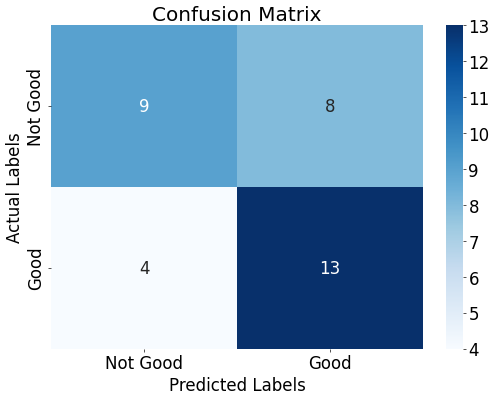

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch

def evaluate_model(model, dataloader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    # Print the classification report
    print(classification_report(all_labels, all_preds, target_names=list(class_names.values())))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

# Usage
# Assuming 'model', 'val_dataloader', 'device', and 'class_names' are already defined
class_names = {0: 'Not Good', 1: 'Good'}
evaluate_model(modelgood, real_test_dataloader, device, class_names)


In [ ]:
save_path = '/content/drive/MyDrive/Satalite_Surf_Project/rivermouth_model/model_weights.pth'
torch.save(model.state_dict(), save_path)

In [ ]:
save_path = '/content/drive/MyDrive/Satalite_Surf_Project/rivermouth_model/model_weights_nosigmoid.pth'
torch.save(model30epoch.state_dict(), save_path)

## Rivermouth Model Creation

Tensor shape: torch.Size([1, 640, 640])
Max pixel value: tensor(253, dtype=torch.uint8)
This is a Rivermouth Image


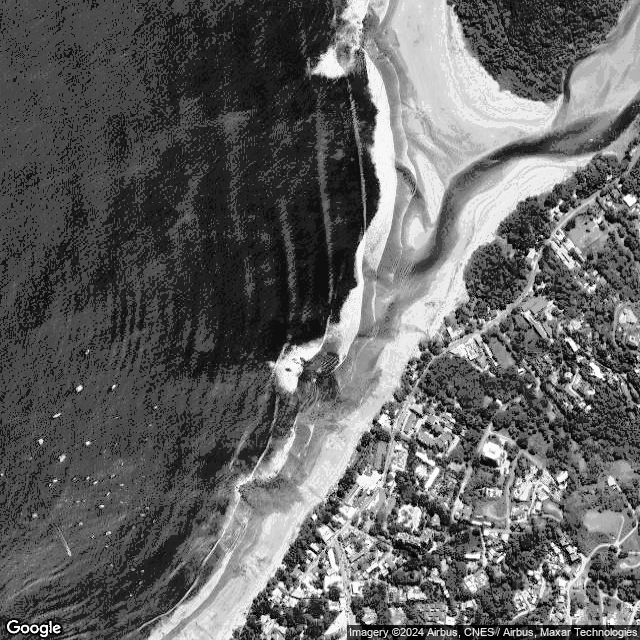

In [ ]:
import torch
import torchvision.transforms as T
from PIL import Image
from IPython.display import display

# Load the image file
image_path = '/content/drive/MyDrive/Satalite_Surf_Project/rivermouth_model/train/Rivermouth/map_snapshot_Eyal_13.png'
image_tensor = torchvision.io.read_image(image_path)

# Confirm the tensor shape and type
print("Tensor shape:", image_tensor.shape)
print("Max pixel value:", image_tensor.max())

# Ensure the tensor is in the correct type and scale for display
if image_tensor.max() <= 1:
    image_tensor = image_tensor * 255  # Rescale to 0-255 if it was 0-1

image_tensor = image_tensor.to(torch.uint8)  # Ensure it's uint8 type

# Convert the tensor to a PIL Image for display
image_pil = T.ToPILImage()(image_tensor)

# Display the image
print("This is a Rivermouth Image")
display(image_pil)


### Preproccessing

In [ ]:
# Create transform function
transforms_train = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(), # data augmentation
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # normalization
])
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
     transforms.CenterCrop((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [ ]:
rivermouth_train_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/rivermouth_model/train'
rivermouth_val_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/rivermouth_model/val'
rivermouth_test_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/rivermouth_model/test'

In [ ]:
# Apply for training and test data
train_dataset = datasets.ImageFolder(rivermouth_train_dir, transforms_train)
val_dataset = datasets.ImageFolder(rivermouth_val_dir, transforms_test)
test_dataset = datasets.ImageFolder(rivermouth_test_dir, transforms_test)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=12, shuffle=True, num_workers=0)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=12, shuffle=False, num_workers=0)
real_test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=12, shuffle=False, num_workers=0)

In [ ]:
print('Train dataset size:', len(train_dataset))
print('Test dataset size:', len(val_dataset))
class_names = train_dataset.classes
print('Class names:', class_names)

Train dataset size: 90
Test dataset size: 23
Class names: ['Rivermouth', 'not_Rivermouth']


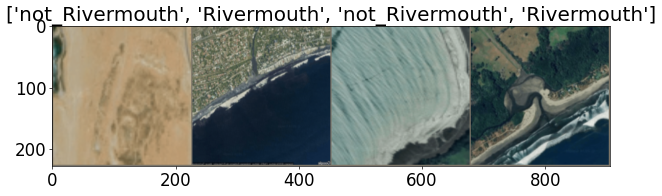

In [ ]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})
def imshow(input, title):
    # torch.Tensor => numpy
    input = input.numpy().transpose((1, 2, 0))
    # undo image normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input = std * input + mean
    input = np.clip(input, 0, 1)
    # display images
    plt.imshow(input)
    plt.title(title)
    plt.show()
# load a batch of train image
iterator = iter(train_dataloader)
# visualize a batch of train image
inputs, classes = next(iterator)
out = torchvision.utils.make_grid(inputs[:4])
imshow(out, title=[class_names[x] for x in classes[:4]])

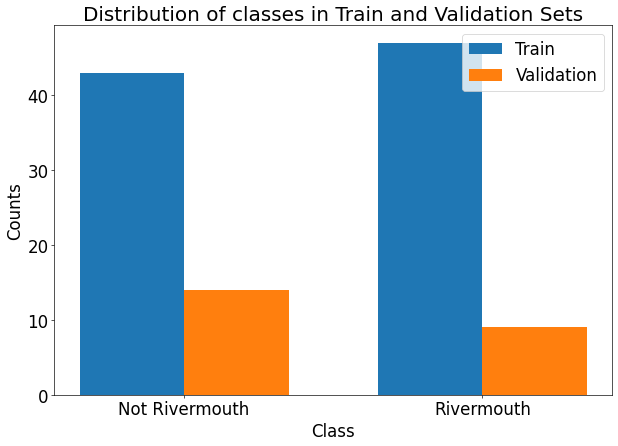

In [ ]:
def get_labels(dataloader):
    labels = []
    for _, cls in dataloader:
        labels.extend(cls.numpy())
    return labels

train_labels = get_labels(train_dataloader)
val_labels = get_labels(val_dataloader)

from collections import Counter

train_label_counts = Counter(train_labels)
val_label_counts = Counter(val_labels)

import matplotlib.pyplot as plt

# Configure plot settings
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})

def plot_value_counts(train_counts, val_counts, class_names):
    # Prepare data
    classes = list(class_names.values())  # Assuming class_names is a dict mapping indices to class names
    train_values = [train_counts.get(i, 0) for i in range(len(classes))]
    val_values = [val_counts.get(i, 0) for i in range(len(classes))]

    # Creating subplots
    fig, ax = plt.subplots()
    index = range(len(classes))
    bar_width = 0.35

    train_bar = ax.bar(index, train_values, bar_width, label='Train')
    val_bar = ax.bar([p + bar_width for p in index], val_values, bar_width, label='Validation')

    ax.set_xlabel('Class')
    ax.set_ylabel('Counts')
    ax.set_title('Distribution of classes in Train and Validation Sets')
    ax.set_xticks([p + bar_width / 2 for p in index])
    ax.set_xticklabels(classes)
    ax.legend()

    plt.show()

# Assuming 'class_names' is a dict mapping label indices to names, like {0: 'Class0', 1: 'Class1', ...}
class_names = {0: 'Not Rivermouth', 1: 'Rivermouth'}
plot_value_counts(train_label_counts, val_label_counts, class_names)


###Training

In [ ]:
# model30epoch = models.resnet50(pretrained=True)
model70epoch = models.resnet50(pretrained=True)


In [ ]:
num_features = model70epoch.fc.in_features
print('Number of features from pre-trained model', num_features)

Number of features from pre-trained model 2048


In [ ]:

# Replace the fully-connected layer with a new one with a single output
# model.fc = nn.Linear(num_features, 1)

# Optionally, you can add a sigmoid activation right here in the model definition,
# but typically it's applied via the loss during training or post-processing during inference
model70epoch.fc = nn.Linear(num_features, 2)


# If you have a specific device (e.g., GPU) set up

model70epoch = model70epoch.to(device)


In [ ]:
# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model70epoch.parameters(), lr=0.0001, momentum=0.9)

In [ ]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

In [ ]:
import time
import torch

def train_and_validate_model(model, train_dataloader, val_dataloader, criterion, optimizer, num_epochs, device):
    # Start time recording
    start_time = time.time()

    # Initialize lists for storing metrics
    train_loss = []
    train_accuracy = []
    val_loss = []
    val_accuracy = []

    # Loop for every epoch
    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1} running")

        """ Training Phase """
        model.train()  # Set model to training mode
        running_loss = 0.0
        running_corrects = 0

        # Iterate over data.
        for inputs, labels in train_dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            # Zero the parameter gradients
            optimizer.zero_grad()

            # Forward
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # Backward + optimize
            loss.backward()
            optimizer.step()

            # Statistics
            running_loss += loss.item() * inputs.size(0)  # Multiply by batch size
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_dataloader.dataset)
        epoch_acc = running_corrects.double() / len(train_dataloader.dataset) * 100

        # Store metrics
        train_loss.append(epoch_loss)
        train_accuracy.append(epoch_acc)

        # Print training progress
        print(f'[Train] Epoch: {epoch+1}/{num_epochs} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.2f}% Time: {time.time() - start_time:.4f}s')

        """ Validation Phase """
        model.eval()  # Set model to evaluate mode
        running_loss = 0.0
        running_corrects = 0

        with torch.no_grad():
            for inputs, labels in val_dataloader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                # Statistics
                running_loss += loss.item() * inputs.size(0)  # Multiply by batch size
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / len(val_dataloader.dataset)
            epoch_acc = running_corrects.double() / len(val_dataloader.dataset) * 100

            # Store metrics
            val_loss.append(epoch_loss)
            val_accuracy.append(epoch_acc)

            # Print validation progress
            print(f'[Validation] Epoch: {epoch+1}/{num_epochs} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.2f}% Time: {time.time() - start_time:.4f}s')

    return train_loss, train_accuracy, val_loss, val_accuracy



In [ ]:

model70epoch = model70epoch.to(device)

train_loss, train_accuracy, val_loss, val_accuracy = train_and_validate_model(
    model70epoch, train_dataloader, val_dataloader, criterion, optimizer, num_epochs=70, device=device)


Epoch 1 running
[Train] Epoch: 1/70 Loss: 0.6960 Acc: 52.22% Time: 2.9739s
[Validation] Epoch: 1/70 Loss: 0.6539 Acc: 56.52% Time: 3.4095s
Epoch 2 running
[Train] Epoch: 2/70 Loss: 0.7044 Acc: 48.89% Time: 6.0538s
[Validation] Epoch: 2/70 Loss: 0.6922 Acc: 52.17% Time: 6.5070s
Epoch 3 running
[Train] Epoch: 3/70 Loss: 0.6763 Acc: 54.44% Time: 8.6301s
[Validation] Epoch: 3/70 Loss: 0.7013 Acc: 52.17% Time: 8.9652s
Epoch 4 running
[Train] Epoch: 4/70 Loss: 0.6825 Acc: 53.33% Time: 11.1185s
[Validation] Epoch: 4/70 Loss: 0.6963 Acc: 56.52% Time: 11.4468s
Epoch 5 running
[Train] Epoch: 5/70 Loss: 0.6864 Acc: 57.78% Time: 13.5724s
[Validation] Epoch: 5/70 Loss: 0.6708 Acc: 69.57% Time: 13.9093s
Epoch 6 running
[Train] Epoch: 6/70 Loss: 0.6684 Acc: 63.33% Time: 16.0297s
[Validation] Epoch: 6/70 Loss: 0.6723 Acc: 69.57% Time: 16.3629s
Epoch 7 running
[Train] Epoch: 7/70 Loss: 0.6555 Acc: 58.89% Time: 19.0325s
[Validation] Epoch: 7/70 Loss: 0.6590 Acc: 65.22% Time: 19.4823s
Epoch 8 running
[Tr

###Eval

In [ ]:
num_epochs=70

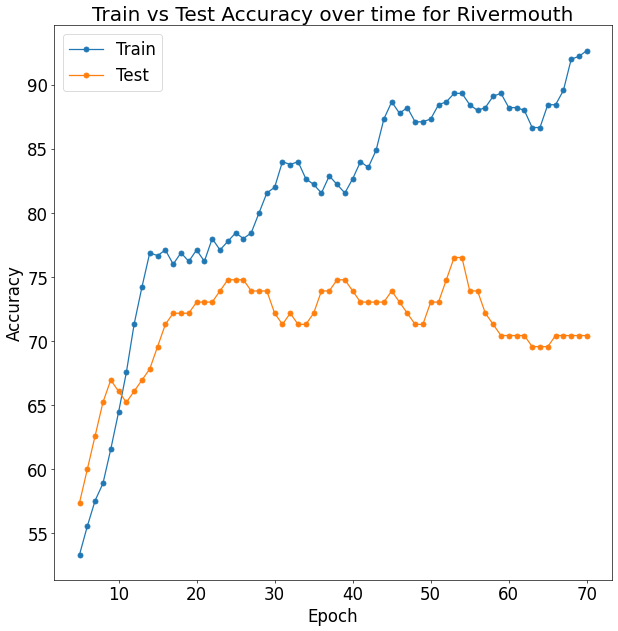

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Assuming train_accuracy and val_accuracy are lists or numpy arrays
# Example: train_accuracy = np.array([...]), val_accuracy = np.array([...])

# Convert to numpy arrays if they are lists
train_accuracy_cpu = [x.item() for x in train_accuracy]
val_accuracy_cpu = [x.item() for x in val_accuracy]

# Apply moving average with a window size of 5 (you can adjust the window size)
window_size = 5
smoothed_train_accuracy = moving_average(train_accuracy_cpu, window_size)
smoothed_val_accuracy = moving_average(val_accuracy_cpu, window_size)

# Adjust the x-axis to match the length of the smoothed data
epochs = np.arange(1, num_epochs + 1)
smoothed_epochs = epochs[window_size - 1:]

# Plot
plt.figure(figsize=(12, 12))
plt.plot(smoothed_epochs, smoothed_train_accuracy, '-o')
plt.plot(smoothed_epochs, smoothed_val_accuracy, '-o')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'])
plt.title('Train vs Test Accuracy over time for Rivermouth')
plt.show()


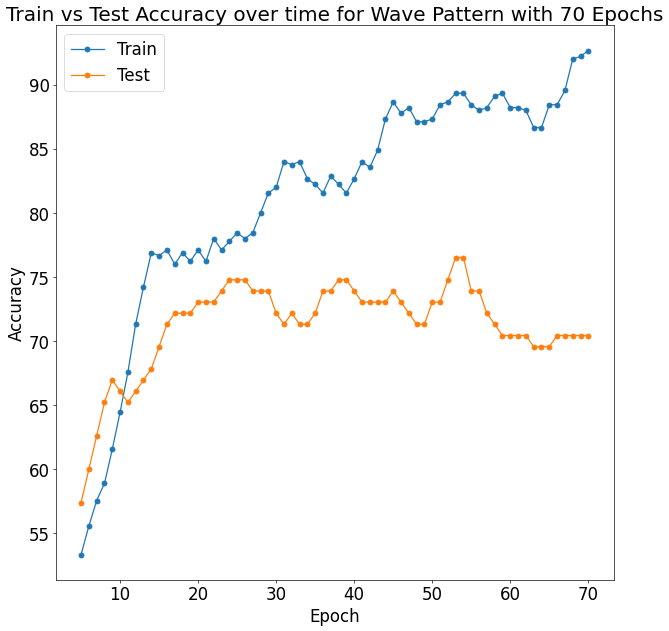

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Assuming train_accuracy and val_accuracy are lists or numpy arrays
# Example: train_accuracy = np.array([...]), val_accuracy = np.array([...])

# Convert to numpy arrays if they are lists
train_accuracy_cpu = [x.item() for x in train_accuracy]
val_accuracy_cpu = [x.item() for x in val_accuracy]

# Apply moving average with a window size of 5 (you can adjust the window size)
window_size = 5
smoothed_train_accuracy = moving_average(train_accuracy_cpu, window_size)
smoothed_val_accuracy = moving_average(val_accuracy_cpu, window_size)

# Adjust the x-axis to match the length of the smoothed data
epochs = np.arange(1, num_epochs + 1)
smoothed_epochs = epochs[window_size - 1:]

# Plot
plt.figure(figsize=(12, 12))
plt.plot(smoothed_epochs, smoothed_train_accuracy, '-o')
plt.plot(smoothed_epochs, smoothed_val_accuracy, '-o')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'])
plt.title(f'Train vs Test Accuracy over time for Wave Pattern with {num_epochs} Epochs')
plt.show()


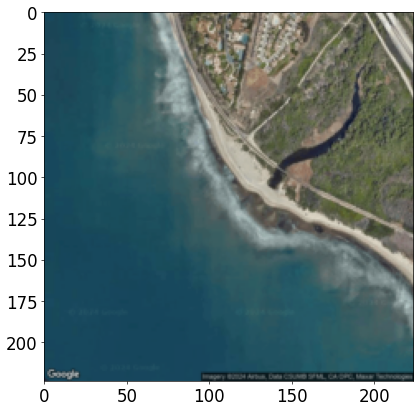

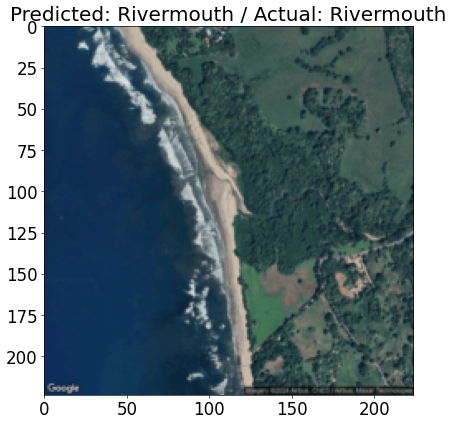

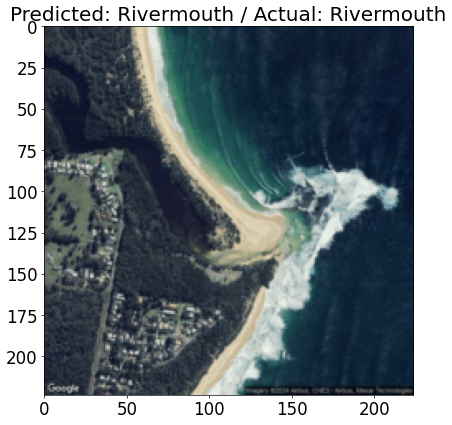

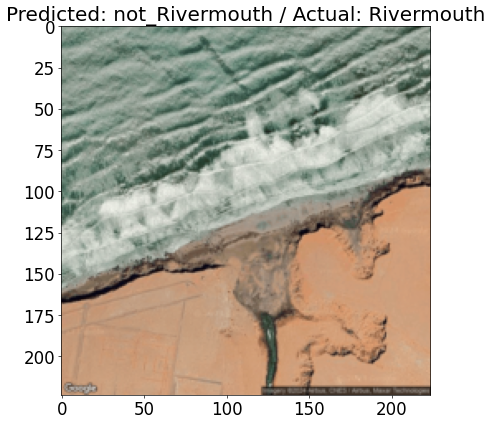

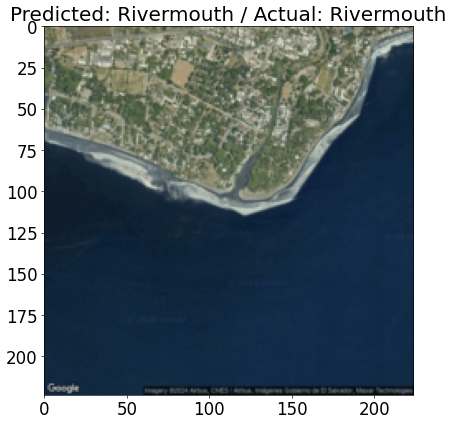

...

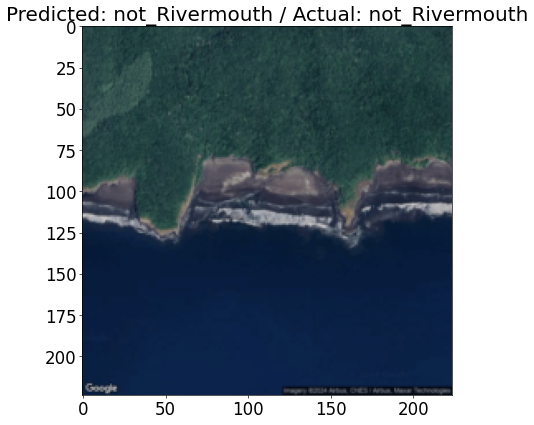

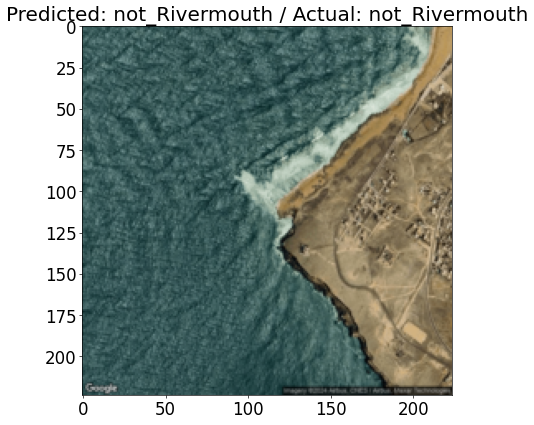

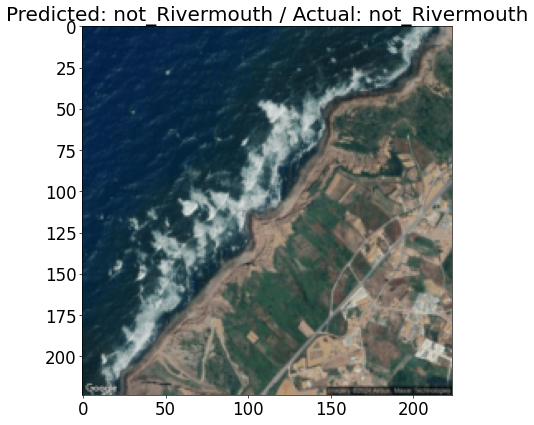

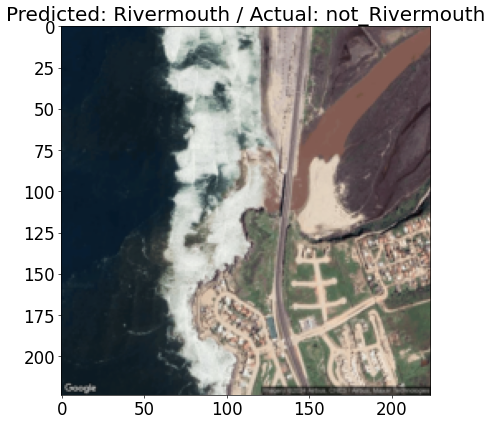

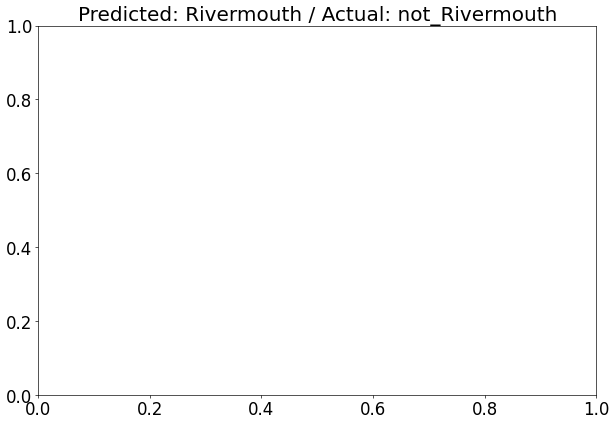

In [ ]:


# Assuming you have a model loaded and set to evaluation mode
model.eval()

# If you're using a GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Define the transformations
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Create the DataLoader
test_dataset = datasets.ImageFolder(rivermouth_test_dir, transform=transforms_test)
real_test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)

# Iterate over data.
for images, labels in real_test_dataloader:
    images = images.to(device)
    labels = labels.to(device)
    outputs = model(images)
    _, preds = torch.max(outputs, 1)

    # Convert image for display
    images = images.cpu().data
    for j in range(images.size()[0]):
        imshow(images[j])
        predicted_label = test_dataset.classes[preds[j]]
        actual_label = test_dataset.classes[labels[j]]
        plt.title(f'Predicted: {predicted_label} / Actual: {actual_label}')


                precision    recall  f1-score   support

Not Rivermouth       0.82      0.64      0.72        14
    Rivermouth       0.58      0.78      0.67         9

      accuracy                           0.70        23
     macro avg       0.70      0.71      0.69        23
  weighted avg       0.73      0.70      0.70        23



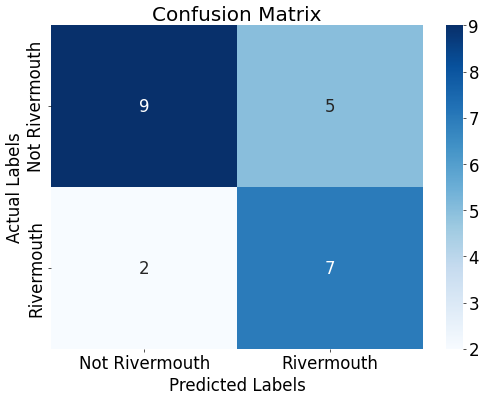

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch

def evaluate_model(model, dataloader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    # Print the classification report
    print(classification_report(all_labels, all_preds, target_names=list(class_names.values())))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

# Usage
# Assuming 'model', 'val_dataloader', 'device', and 'class_names' are already defined
class_names = {0: 'Not Rivermouth', 1: 'Rivermouth'}
evaluate_model(model, val_dataloader, device, class_names)


                precision    recall  f1-score   support

Not Rivermouth       0.90      0.64      0.75        14
    Rivermouth       0.62      0.89      0.73         9

      accuracy                           0.74        23
     macro avg       0.76      0.77      0.74        23
  weighted avg       0.79      0.74      0.74        23



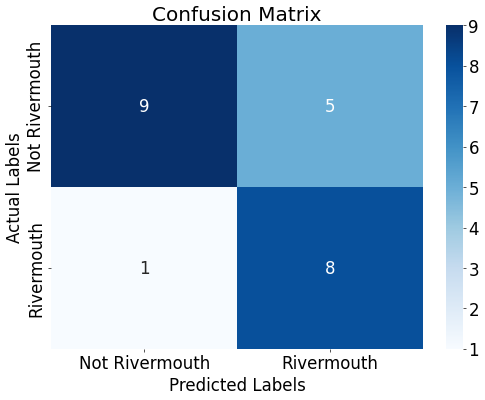

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch

def evaluate_model(model, dataloader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    # Print the classification report
    print(classification_report(all_labels, all_preds, target_names=list(class_names.values())))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

# Usage
# Assuming 'model', 'val_dataloader', 'device', and 'class_names' are already defined
class_names = {0: 'Not Rivermouth', 1: 'Rivermouth'}
evaluate_model(model30epoch, val_dataloader, device, class_names)


                precision    recall  f1-score   support

Not Rivermouth       0.82      0.64      0.72        14
    Rivermouth       0.58      0.78      0.67         9

      accuracy                           0.70        23
     macro avg       0.70      0.71      0.69        23
  weighted avg       0.73      0.70      0.70        23



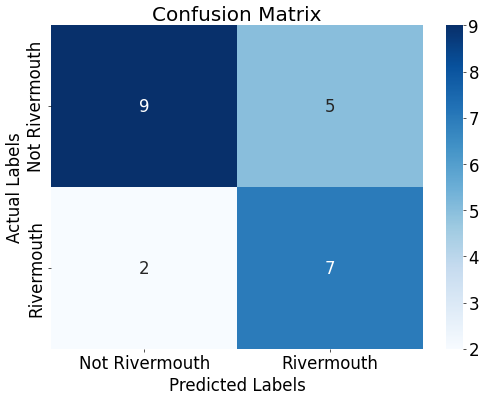

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch

def evaluate_model(model, dataloader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    # Print the classification report
    print(classification_report(all_labels, all_preds, target_names=list(class_names.values())))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

# Usage
# Assuming 'model', 'val_dataloader', 'device', and 'class_names' are already defined
class_names = {0: 'Not Rivermouth', 1: 'Rivermouth'}
evaluate_model(model70epoch, val_dataloader, device, class_names)


                precision    recall  f1-score   support

Not Rivermouth       0.82      0.64      0.72        14
    Rivermouth       0.58      0.78      0.67         9

      accuracy                           0.70        23
     macro avg       0.70      0.71      0.69        23
  weighted avg       0.73      0.70      0.70        23



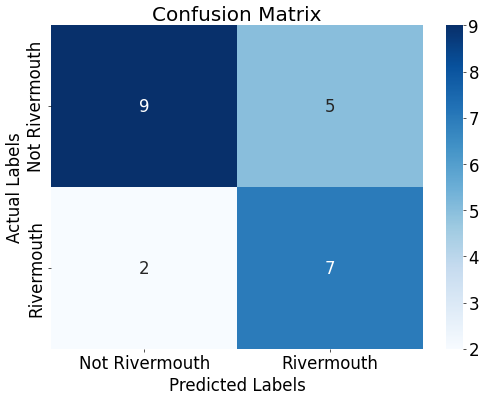

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch

def evaluate_model(model, dataloader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    # Print the classification report
    print(classification_report(all_labels, all_preds, target_names=list(class_names.values())))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

# Usage
# Assuming 'model', 'val_dataloader', 'device', and 'class_names' are already defined
class_names = {0: 'Not Rivermouth', 1: 'Rivermouth'}
evaluate_model(model, val_dataloader, device, class_names)


In [ ]:
save_path = '/content/drive/MyDrive/Satalite_Surf_Project/rivermouth_model/model_weights.pth'
torch.save(model.state_dict(), save_path)

In [ ]:
save_path = '/content/drive/MyDrive/Satalite_Surf_Project/rivermouth_model/model_weights_nosigmoid.pth'
torch.save(model30epoch.state_dict(), save_path)

## Bay Model Creation

###Intaliztion

In [ ]:
# Set up CUDA in OS
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
# Import libabries
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import seaborn as sn
import pandas as pd
import torchvision
from torchvision import *
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image
import torchvision.transforms as T
from torchvision import datasets, models, transforms
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import time
import copy

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
# Find out if a GPU is available
use_cuda = torch.cuda.is_available()
print(use_cuda)

cuda
True


Tensor shape: torch.Size([1, 640, 640])
Max pixel value: tensor(253, dtype=torch.uint8)
This is a Bay Image


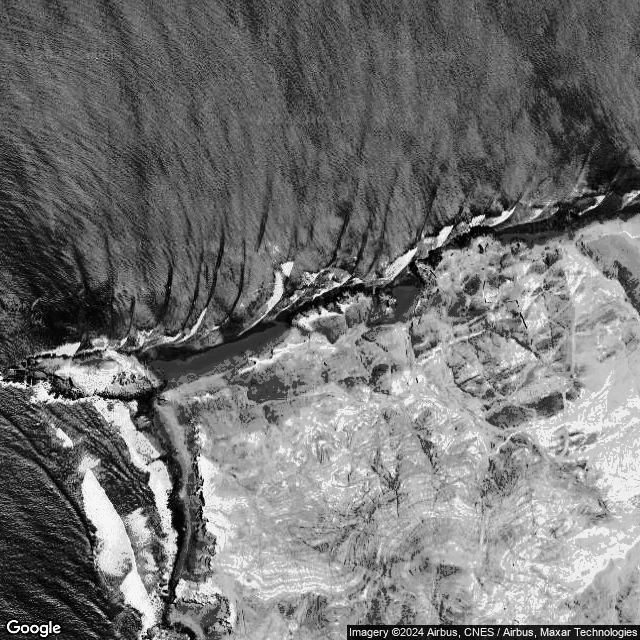

In [ ]:

# Load the image file
image_path = '/content/drive/MyDrive/Satalite_Surf_Project/bay_model/train/Bay/map_snapshot_Eyal_15_Good.png'
image_tensor = torchvision.io.read_image(image_path)

# Confirm the tensor shape and type
print("Tensor shape:", image_tensor.shape)
print("Max pixel value:", image_tensor.max())

# Ensure the tensor is in the correct type and scale for display
if image_tensor.max() <= 1:
    image_tensor = image_tensor * 255  # Rescale to 0-255 if it was 0-1

image_tensor = image_tensor.to(torch.uint8)  # Ensure it's uint8 type

# Convert the tensor to a PIL Image for display
image_pil = T.ToPILImage()(image_tensor)

# Display the image
print("This is a Bay Image")
display(image_pil)


In [ ]:
# Create transform function
transforms_train = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(), # data augmentation
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # normalization
])
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
     transforms.CenterCrop((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [ ]:
bay_train_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/bay_model/train'
bay_val_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/bay_model/val'
bay_test_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/bay_model/test'

In [ ]:
# Apply for training and test data
train_dataset = datasets.ImageFolder(bay_train_dir, transforms_train)
val_dataset = datasets.ImageFolder(bay_val_dir, transforms_test)
test_dataset = datasets.ImageFolder(bay_test_dir, transforms_test)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=12, shuffle=True, num_workers=0)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=12, shuffle=False, num_workers=0)
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)

In [ ]:
print('Train dataset size:', len(train_dataset))
print('Test dataset size:', len(val_dataset))
class_names = train_dataset.classes
print('Class names:', class_names)

Train dataset size: 117
Test dataset size: 30
Class names: ['Bay', 'not_Bay']


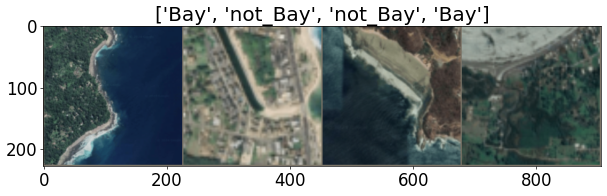

In [ ]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})
def imshow(input, title):
    # torch.Tensor => numpy
    input = input.numpy().transpose((1, 2, 0))
    # undo image normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input = std * input + mean
    input = np.clip(input, 0, 1)
    # display images
    plt.imshow(input)
    plt.title(title)
    plt.show()
# load a batch of train image
iterator = iter(train_dataloader)
# visualize a batch of train image
inputs, classes = next(iterator)
out = torchvision.utils.make_grid(inputs[:4])
imshow(out, title=[class_names[x] for x in classes[:4]])

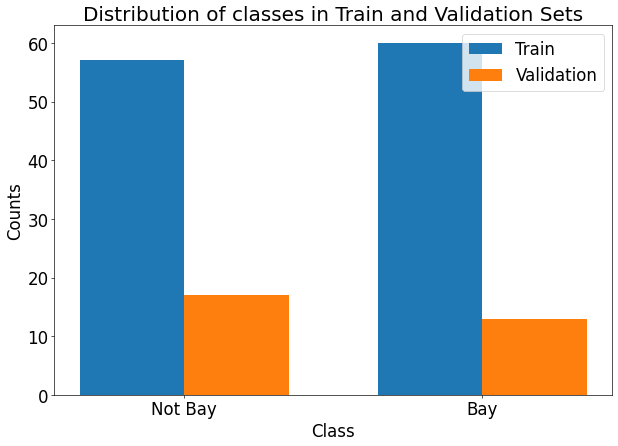

In [ ]:
def get_labels(dataloader):
    labels = []
    for _, cls in dataloader:
        labels.extend(cls.numpy())
    return labels

train_labels = get_labels(train_dataloader)
val_labels = get_labels(val_dataloader)

from collections import Counter

train_label_counts = Counter(train_labels)
val_label_counts = Counter(val_labels)

import matplotlib.pyplot as plt

# Configure plot settings
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})

def plot_value_counts(train_counts, val_counts, class_names):
    # Prepare data
    classes = list(class_names.values())  # Assuming class_names is a dict mapping indices to class names
    train_values = [train_counts.get(i, 0) for i in range(len(classes))]
    val_values = [val_counts.get(i, 0) for i in range(len(classes))]

    # Creating subplots
    fig, ax = plt.subplots()
    index = range(len(classes))
    bar_width = 0.35

    train_bar = ax.bar(index, train_values, bar_width, label='Train')
    val_bar = ax.bar([p + bar_width for p in index], val_values, bar_width, label='Validation')

    ax.set_xlabel('Class')
    ax.set_ylabel('Counts')
    ax.set_title('Distribution of classes in Train and Validation Sets')
    ax.set_xticks([p + bar_width / 2 for p in index])
    ax.set_xticklabels(classes)
    ax.legend()

    plt.show()

# Assuming 'class_names' is a dict mapping label indices to names, like {0: 'Class0', 1: 'Class1', ...}
class_names = {0: 'Not Bay', 1: 'Bay'}
plot_value_counts(train_label_counts, val_label_counts, class_names)


###Training

In [ ]:
model = models.resnet50(pretrained=True)
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:
num_features = model.fc.in_features
print('Number of features from pre-trained model', num_features)

Number of features from pre-trained model 2048


In [ ]:
model.fc = nn.Linear(num_features, 2)
# If you have a specific device (e.g., GPU) set up

model = model.to(device)

In [ ]:
# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)
torch.manual_seed(42)
torch.cuda.manual_seed(42)

In [ ]:
import time
import torch

num_epochs = 100   # Set number of epochs
start_time = time.time()  # Start time recording

# Initialize lists for storing metrics
train_loss = []
train_accuracy = []
val_loss = []
val_accuracy = []

for epoch in range(num_epochs):  # Loop for every epoch
    print("Epoch {} running".format(epoch))  # Printing message

    """ Training Phase """
    model.train()  # Set model to training mode
    running_loss = 0.0
    running_corrects = 0

    # Iterate over data.
    for inputs, labels in train_dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        # Backward + optimize
        loss.backward()
        optimizer.step()

        # Statistics
        running_loss += loss.item() * inputs.size(0)  # Multiply by batch size
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_dataloader.dataset)  # Dividing by the total number of samples
    epoch_acc = running_corrects.double() / len(train_dataloader.dataset) * 100

    # Store metrics
    train_loss.append(epoch_loss)
    train_accuracy.append(epoch_acc)

    # Print training progress
    print('[Train] Epoch: {}/{} Loss: {:.4f} Acc: {:.2f}% Time: {:.4f}s'.format(
        epoch + 1, num_epochs, epoch_loss, epoch_acc, time.time() - start_time))

    """ Validation Phase """
    model.eval()  # Set model to evaluate mode
    running_loss = 0.0
    running_corrects = 0

    with torch.no_grad():
        for inputs, labels in val_dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # Statistics
            running_loss += loss.item() * inputs.size(0)  # Multiply by batch size
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(val_dataloader.dataset)  # Dividing by the total number of samples
        epoch_acc = running_corrects.double() / len(val_dataloader.dataset) * 100

        # Store metrics
        val_loss.append(epoch_loss)
        val_accuracy.append(epoch_acc)

        # Print validation progress
        print('[Validation] Epoch: {}/{} Loss: {:.4f} Acc: {:.2f}% Time: {:.4f}s'.format(
            epoch + 1, num_epochs, epoch_loss, epoch_acc, time.time() - start_time))


Epoch 0 running
[Train] Epoch: 1/100 Loss: 0.7088 Acc: 46.15% Time: 2.8280s
[Validation] Epoch: 1/100 Loss: 0.7133 Acc: 43.33% Time: 3.2590s
Epoch 1 running
[Train] Epoch: 2/100 Loss: 0.7008 Acc: 49.57% Time: 6.0685s
[Validation] Epoch: 2/100 Loss: 0.7153 Acc: 53.33% Time: 6.4967s
Epoch 2 running
[Train] Epoch: 3/100 Loss: 0.6862 Acc: 54.70% Time: 11.7594s
[Validation] Epoch: 3/100 Loss: 0.7075 Acc: 50.00% Time: 12.3736s
Epoch 3 running
[Train] Epoch: 4/100 Loss: 0.6847 Acc: 56.41% Time: 15.3908s
[Validation] Epoch: 4/100 Loss: 0.7093 Acc: 53.33% Time: 15.8415s
Epoch 4 running
[Train] Epoch: 5/100 Loss: 0.6728 Acc: 59.83% Time: 18.5683s
[Validation] Epoch: 5/100 Loss: 0.7048 Acc: 53.33% Time: 19.0161s
Epoch 5 running
[Train] Epoch: 6/100 Loss: 0.6676 Acc: 59.83% Time: 21.8565s
[Validation] Epoch: 6/100 Loss: 0.7075 Acc: 53.33% Time: 22.4566s
Epoch 6 running
[Train] Epoch: 7/100 Loss: 0.6414 Acc: 69.23% Time: 25.6730s
[Validation] Epoch: 7/100 Loss: 0.6998 Acc: 53.33% Time: 26.1250s
Epo

###Eval

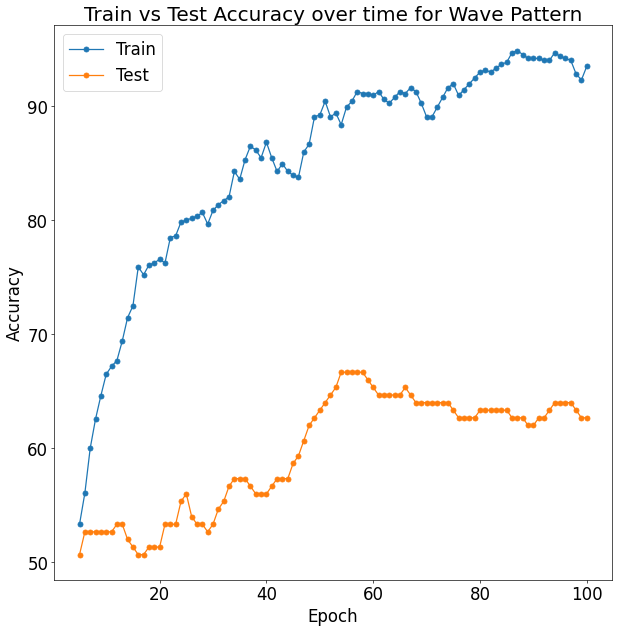

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Assuming train_accuracy and val_accuracy are lists or numpy arrays
# Example: train_accuracy = np.array([...]), val_accuracy = np.array([...])

# Convert to numpy arrays if they are lists
train_accuracy_cpu = [x.item() for x in train_accuracy]
val_accuracy_cpu = [x.item() for x in val_accuracy]

# Apply moving average with a window size of 5 (you can adjust the window size)
window_size = 5
smoothed_train_accuracy = moving_average(train_accuracy_cpu, window_size)
smoothed_val_accuracy = moving_average(val_accuracy_cpu, window_size)

# Adjust the x-axis to match the length of the smoothed data
epochs = np.arange(1, num_epochs + 1)
smoothed_epochs = epochs[window_size - 1:]

# Plot
plt.figure(figsize=(12, 12))
plt.plot(smoothed_epochs, smoothed_train_accuracy, '-o')
plt.plot(smoothed_epochs, smoothed_val_accuracy, '-o')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'])
plt.title('Train vs Test Accuracy over time for Wave Pattern')
plt.show()


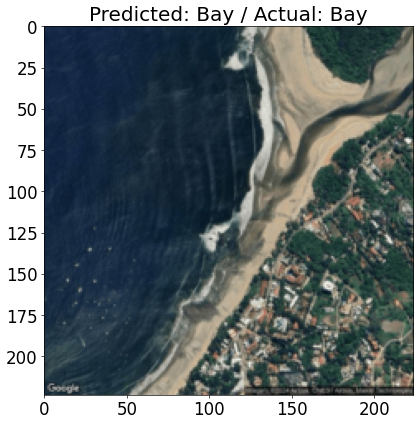

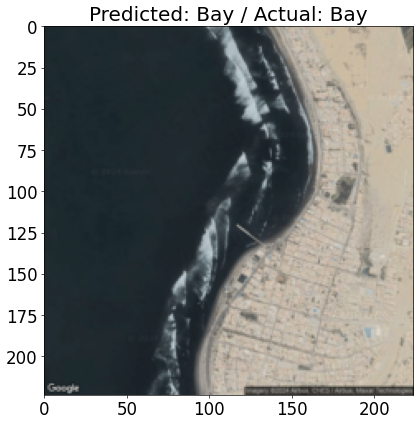

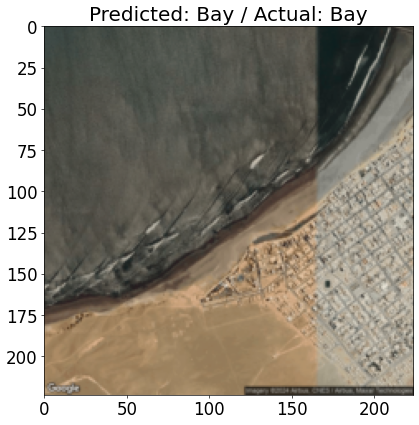

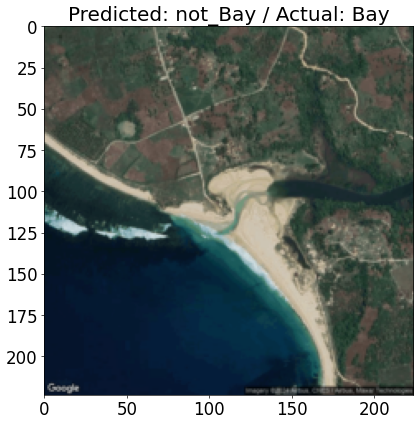

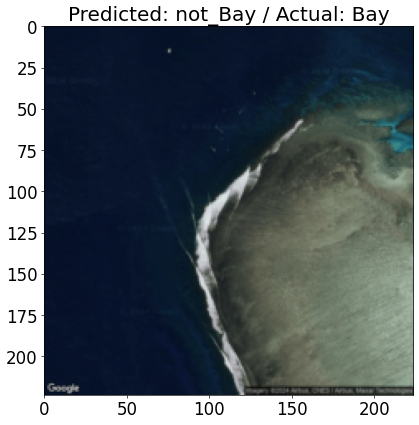

...

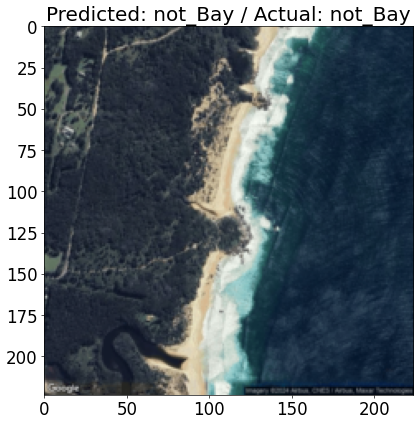

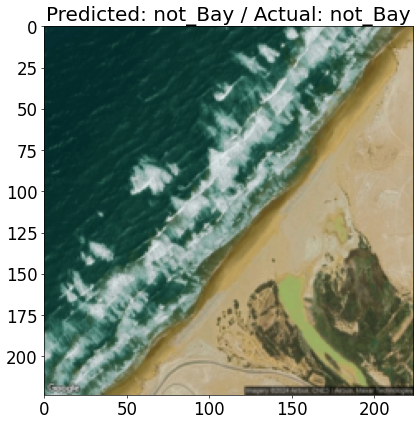

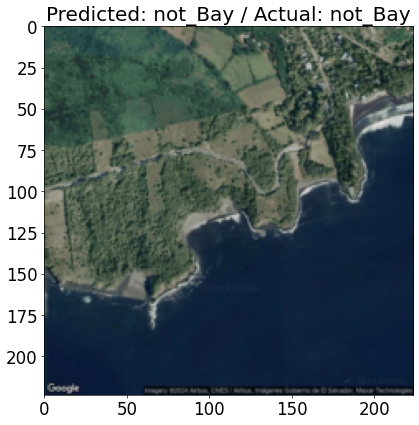

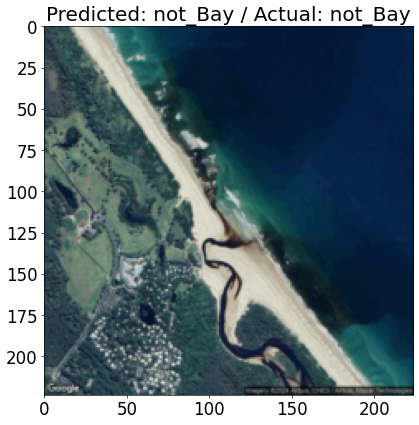

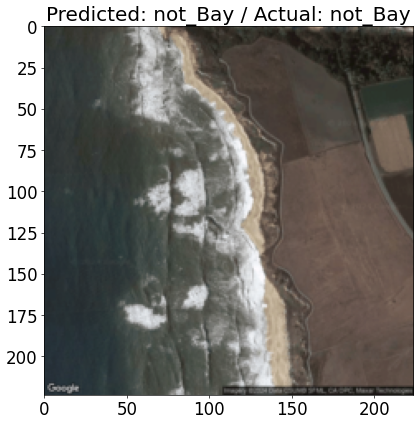

In [ ]:



model.eval()

# If you're using a GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Define the transformations
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Create the DataLoader
test_dataset = datasets.ImageFolder(bay_test_dir, transform=transforms_test)
real_test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)

# Iterate over data.
for images, labels in real_test_dataloader:
    images = images.to(device)
    labels = labels.to(device)
    outputs = model(images)
    _, preds = torch.max(outputs, 1)

    # Convert image for display
    images = images.cpu().data
    for j in range(images.size()[0]):
        predicted_label = test_dataset.classes[preds[j]]
        actual_label = test_dataset.classes[labels[j]]
        plt.title(f'Predicted: {predicted_label} / Actual: {actual_label}')
        imshow(images[j])


              precision    recall  f1-score   support

     Not Bay       0.86      0.75      0.80         8
         Bay       0.80      0.89      0.84         9

    accuracy                           0.82        17
   macro avg       0.83      0.82      0.82        17
weighted avg       0.83      0.82      0.82        17



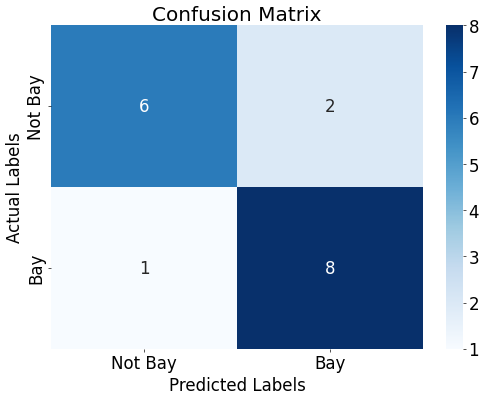

In [ ]:
import seaborn as sns
def evaluate_model_and_plot_confusion_matrix(model, dataloader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    print(classification_report(all_labels, all_preds, target_names=list(class_names.values())))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

# Usage
evaluate_model_and_plot_confusion_matrix(model, test_dataloader, device, class_names)


              precision    recall  f1-score   support

     Not Bay       1.00      0.38      0.55         8
         Bay       0.64      1.00      0.78         9

    accuracy                           0.71        17
   macro avg       0.82      0.69      0.66        17
weighted avg       0.81      0.71      0.67        17



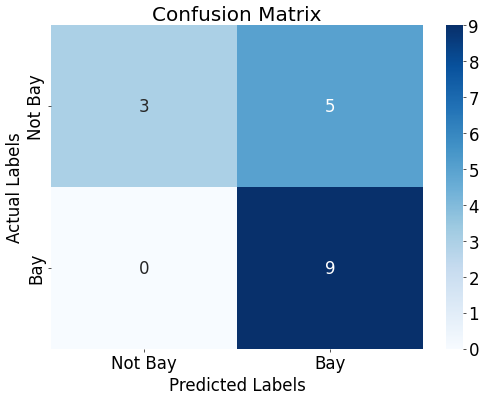

In [ ]:
import seaborn as sns
def evaluate_model_and_plot_confusion_matrix(model, dataloader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    print(classification_report(all_labels, all_preds, target_names=list(class_names.values())))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

# Usage
evaluate_model_and_plot_confusion_matrix(model, test_dataloader, device, class_names)


In [ ]:
save_path = '/content/drive/MyDrive/Satalite_Surf_Project/bay_model/model_weights_nosigmoid.pth'
torch.save(model.state_dict(), save_path)

## Wave Pattern Model Creation

###Intalization

In [ ]:
# Set up CUDA in OS
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
# Import libabries
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import seaborn as sn
import pandas as pd
import torchvision
from torchvision import *
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image
import torchvision.transforms as T
from torchvision import datasets, models, transforms
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from PIL import Image
from IPython.display import display
import matplotlib.pyplot as plt
import time
import copy

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")
# Setup device agnostic code
device = "cuda" if torch.cuda.is_available() else "cpu"
print(device)
# Find out if a GPU is available
use_cuda = torch.cuda.is_available()
print(use_cuda)

cuda
True


Tensor shape: torch.Size([1, 640, 640])
Max pixel value: tensor(249, dtype=torch.uint8)
This is a Wave Pattern Image


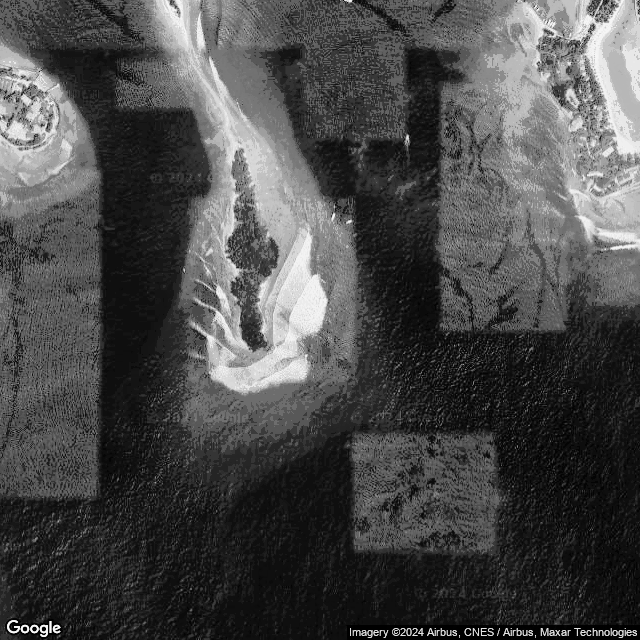

In [ ]:
import torch
import torchvision.transforms as T
from PIL import Image
from IPython.display import display

# Load the image file
image_path = '/content/drive/MyDrive/Satalite_Surf_Project/wavepattern_model/train/Wave Pattern/map_snapshot_Eyal 2.png'
image_tensor = torchvision.io.read_image(image_path)

# Confirm the tensor shape and type
print("Tensor shape:", image_tensor.shape)
print("Max pixel value:", image_tensor.max())

# Ensure the tensor is in the correct type and scale for display
if image_tensor.max() <= 1:
    image_tensor = image_tensor * 255  # Rescale to 0-255 if it was 0-1

image_tensor = image_tensor.to(torch.uint8)  # Ensure it's uint8 type

# Convert the tensor to a PIL Image for display
image_pil = T.ToPILImage()(image_tensor)

# Display the image
print("This is a Wave Pattern Image")
display(image_pil)

In [ ]:
# Create transform function
transforms_train = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(), # data augmentation
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) # normalization
])
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),   #must same as here
     transforms.CenterCrop((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

In [ ]:
wavepattern_train_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/wavepattern_model/train'
wavepattern_val_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/wavepattern_model/val'
wavepattern_test_dir = r'/content/drive/MyDrive/Satalite_Surf_Project/wavepattern_model/test'

In [ ]:
# Apply for training and test data
train_dataset = datasets.ImageFolder(wavepattern_train_dir, transforms_train)
val_dataset = datasets.ImageFolder(wavepattern_val_dir, transforms_test)
test_dataset = datasets.ImageFolder(wavepattern_test_dir, transforms_test)

train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=12, shuffle=True, num_workers=0)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=12, shuffle=False, num_workers=0)
real_test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=12, shuffle=False, num_workers=0)

In [ ]:
print('Train dataset size:', len(train_dataset))
print('Val dataset size:', len(val_dataset))
class_names = train_dataset.classes
print('Class names:', class_names)

Train dataset size: 128
Val dataset size: 32
Class names: ['Wave Pattern', 'not_Wave Pattern']


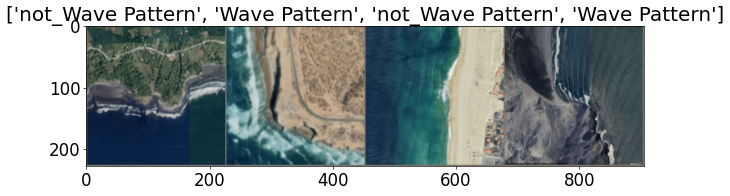

In [ ]:
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})
def imshow(input, title):
    # torch.Tensor => numpy
    input = input.numpy().transpose((1, 2, 0))
    # undo image normalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    input = std * input + mean
    input = np.clip(input, 0, 1)
    # display images
    plt.imshow(input)
    plt.title(title)
    plt.show()
# load a batch of train image
iterator = iter(train_dataloader)
# visualize a batch of train image
inputs, classes = next(iterator)
out = torchvision.utils.make_grid(inputs[:4])
imshow(out, title=[class_names[x] for x in classes[:4]])

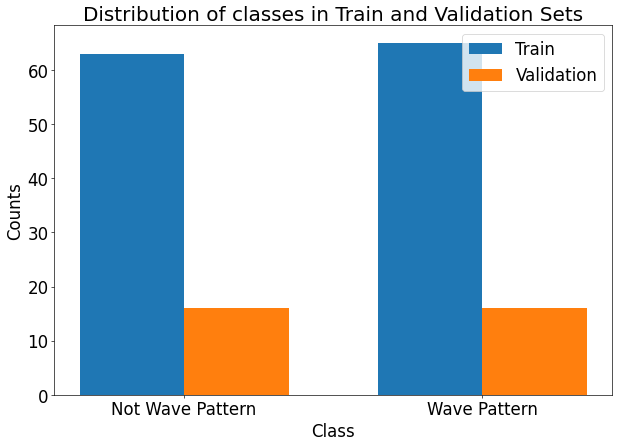

In [ ]:
def get_labels(dataloader):
    labels = []
    for _, cls in dataloader:
        labels.extend(cls.numpy())
    return labels

train_labels = get_labels(train_dataloader)
val_labels = get_labels(val_dataloader)

from collections import Counter

train_label_counts = Counter(train_labels)
val_label_counts = Counter(val_labels)

import matplotlib.pyplot as plt

# Configure plot settings
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 60
plt.rcParams.update({'font.size': 20})

def plot_value_counts(train_counts, val_counts, class_names):
    # Prepare data
    classes = list(class_names.values())  # Assuming class_names is a dict mapping indices to class names
    train_values = [train_counts.get(i, 0) for i in range(len(classes))]
    val_values = [val_counts.get(i, 0) for i in range(len(classes))]

    # Creating subplots
    fig, ax = plt.subplots()
    index = range(len(classes))
    bar_width = 0.35

    train_bar = ax.bar(index, train_values, bar_width, label='Train')
    val_bar = ax.bar([p + bar_width for p in index], val_values, bar_width, label='Validation')

    ax.set_xlabel('Class')
    ax.set_ylabel('Counts')
    ax.set_title('Distribution of classes in Train and Validation Sets')
    ax.set_xticks([p + bar_width / 2 for p in index])
    ax.set_xticklabels(classes)
    ax.legend()

    plt.show()

# Assuming 'class_names' is a dict mapping label indices to names, like {0: 'Class0', 1: 'Class1', ...}
class_names = {0: 'Not Wave Pattern', 1: 'Wave Pattern'}
plot_value_counts(train_label_counts, val_label_counts, class_names)


###Training

In [ ]:
model = models.resnet50(pretrained=True)
num_features = model.fc.in_features
print('Number of features from pre-trained model', num_features)

Number of features from pre-trained model 2048


In [ ]:


model.fc = nn.Linear(num_features, 2)


# If you have a specific device (e.g., GPU) set up

model = model.to(device)


In [ ]:
# Define loss and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)

In [ ]:
torch.manual_seed(42)
torch.cuda.manual_seed(42)

In [ ]:
import time
import torch

num_epochs = 100   # Set number of epochs
start_time = time.time()  # Start time recording

# Initialize lists for storing metrics
train_loss = []
train_accuracy = []
val_loss = []
val_accuracy = []

for epoch in range(num_epochs):  # Loop for every epoch
    print("Epoch {} running".format(epoch))  # Printing message

    """ Training Phase """
    model.train()  # Set model to training mode
    running_loss = 0.0
    running_corrects = 0

    # Iterate over data.
    for inputs, labels in train_dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward
        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)
        loss = criterion(outputs, labels)

        # Backward + optimize
        loss.backward()
        optimizer.step()

        # Statistics
        running_loss += loss.item() * inputs.size(0)  # Multiply by batch size
        running_corrects += torch.sum(preds == labels.data)

    epoch_loss = running_loss / len(train_dataloader.dataset)  # Dividing by the total number of samples
    epoch_acc = running_corrects.double() / len(train_dataloader.dataset) * 100

    # Store metrics
    train_loss.append(epoch_loss)
    train_accuracy.append(epoch_acc)

    # Print training progress
    print('[Train] Epoch: {}/{} Loss: {:.4f} Acc: {:.2f}% Time: {:.4f}s'.format(
        epoch + 1, num_epochs, epoch_loss, epoch_acc, time.time() - start_time))

    """ Validation Phase """
    model.eval()  # Set model to evaluate mode
    running_loss = 0.0
    running_corrects = 0

    with torch.no_grad():
        for inputs, labels in val_dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)

            # Statistics
            running_loss += loss.item() * inputs.size(0)  # Multiply by batch size
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(val_dataloader.dataset)  # Dividing by the total number of samples
        epoch_acc = running_corrects.double() / len(val_dataloader.dataset) * 100

        # Store metrics
        val_loss.append(epoch_loss)
        val_accuracy.append(epoch_acc)

        # Print validation progress
        print('[Validation] Epoch: {}/{} Loss: {:.4f} Acc: {:.2f}% Time: {:.4f}s'.format(
            epoch + 1, num_epochs, epoch_loss, epoch_acc, time.time() - start_time))


Epoch 0 running
[Train] Epoch: 1/100 Loss: 0.7324 Acc: 46.09% Time: 3.1556s
[Validation] Epoch: 1/100 Loss: 0.7118 Acc: 50.00% Time: 3.6346s
Epoch 1 running
[Train] Epoch: 2/100 Loss: 0.6553 Acc: 63.28% Time: 6.6617s
[Validation] Epoch: 2/100 Loss: 0.6902 Acc: 50.00% Time: 7.1329s
Epoch 2 running
[Train] Epoch: 3/100 Loss: 0.6638 Acc: 61.72% Time: 10.8339s
[Validation] Epoch: 3/100 Loss: 0.6758 Acc: 59.38% Time: 11.4084s
Epoch 3 running
[Train] Epoch: 4/100 Loss: 0.6489 Acc: 65.62% Time: 14.4470s
[Validation] Epoch: 4/100 Loss: 0.6553 Acc: 59.38% Time: 14.9153s
Epoch 4 running
[Train] Epoch: 5/100 Loss: 0.6398 Acc: 69.53% Time: 17.9665s
[Validation] Epoch: 5/100 Loss: 0.6473 Acc: 62.50% Time: 18.4531s
Epoch 5 running
[Train] Epoch: 6/100 Loss: 0.6179 Acc: 71.88% Time: 21.6109s
[Validation] Epoch: 6/100 Loss: 0.6400 Acc: 65.62% Time: 22.5441s
Epoch 6 running
[Train] Epoch: 7/100 Loss: 0.6249 Acc: 70.31% Time: 26.0548s
[Validation] Epoch: 7/100 Loss: 0.6331 Acc: 68.75% Time: 26.5061s
Epo

### Eval

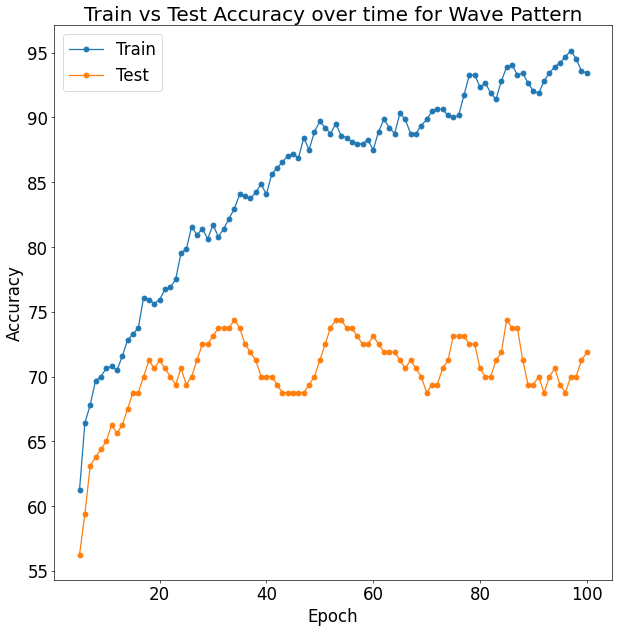

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Function to calculate the moving average
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

# Assuming train_accuracy and val_accuracy are lists or numpy arrays
# Example: train_accuracy = np.array([...]), val_accuracy = np.array([...])

# Convert to numpy arrays if they are lists
train_accuracy_cpu = [x.item() for x in train_accuracy]
val_accuracy_cpu = [x.item() for x in val_accuracy]

# Apply moving average with a window size of 5 (you can adjust the window size)
window_size = 5
smoothed_train_accuracy = moving_average(train_accuracy_cpu, window_size)
smoothed_val_accuracy = moving_average(val_accuracy_cpu, window_size)

# Adjust the x-axis to match the length of the smoothed data
epochs = np.arange(1, num_epochs + 1)
smoothed_epochs = epochs[window_size - 1:]

# Plot
plt.figure(figsize=(12, 12))
plt.plot(smoothed_epochs, smoothed_train_accuracy, '-o')
plt.plot(smoothed_epochs, smoothed_val_accuracy, '-o')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Test'])
plt.title('Train vs Test Accuracy over time for Wave Pattern')
plt.show()


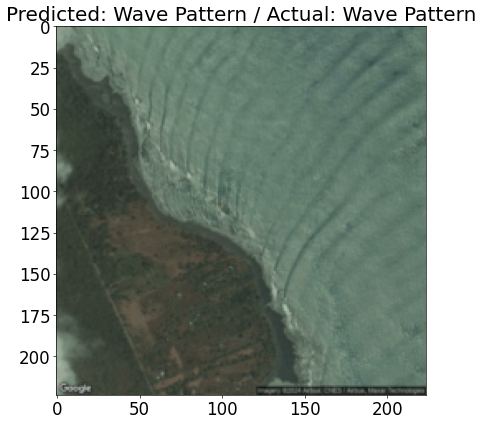

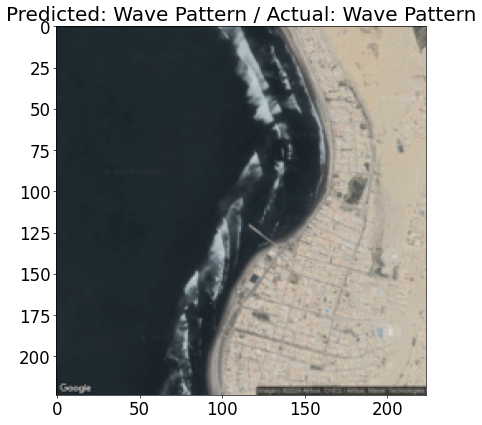

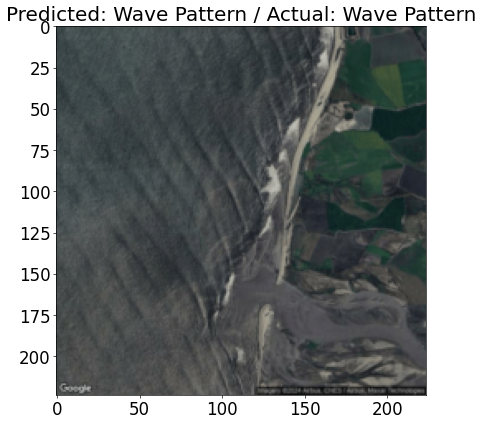

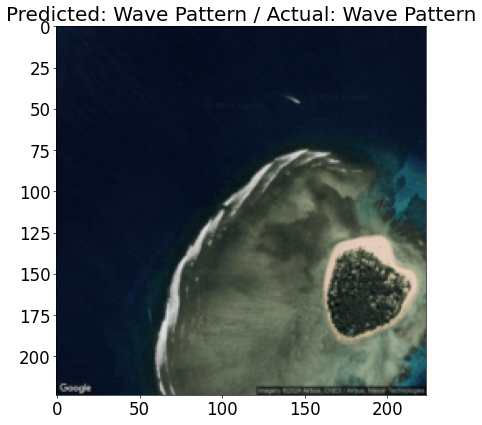

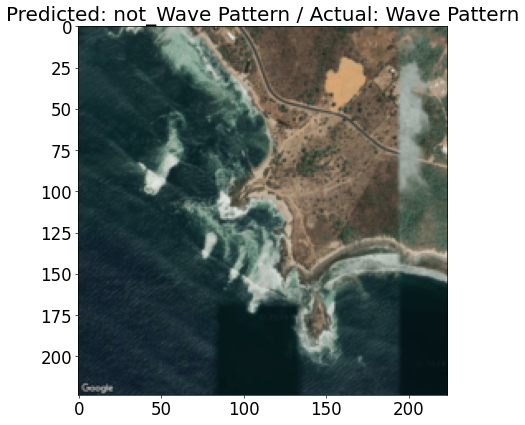

...

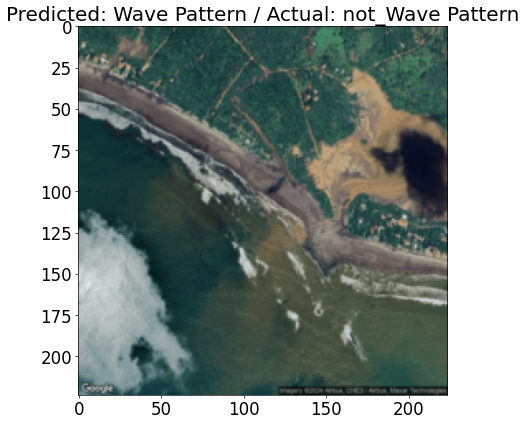

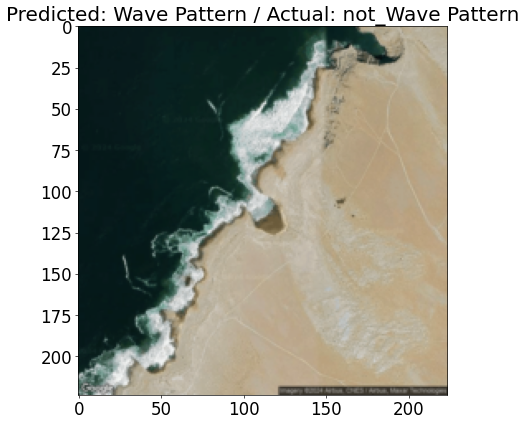

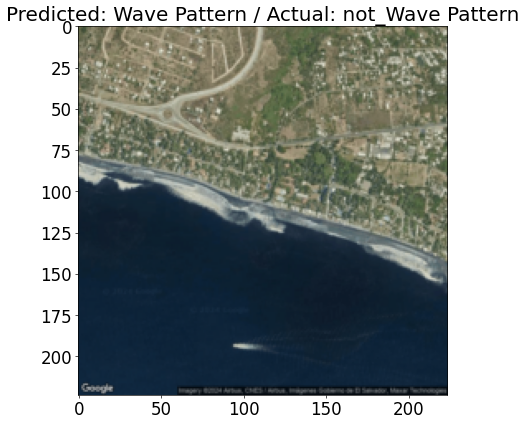

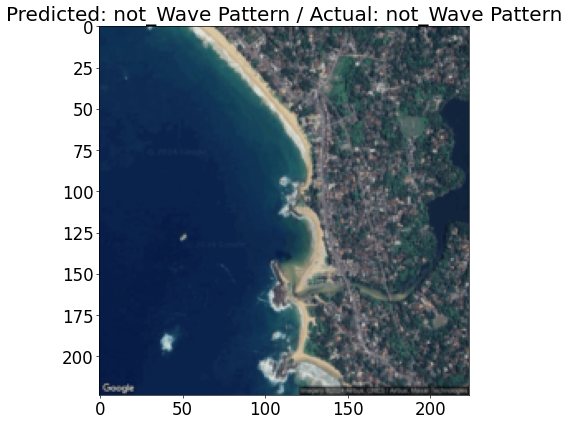

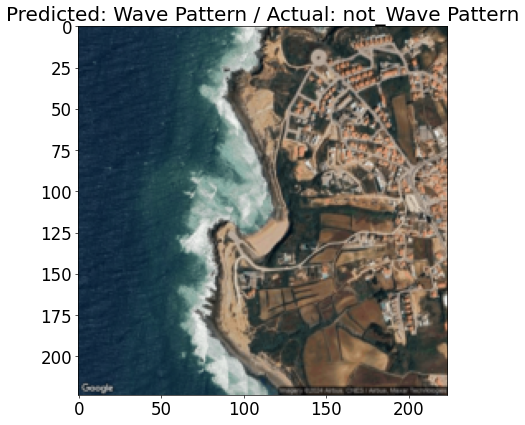

In [ ]:


# Assuming you have a model loaded and set to evaluation mode
model.eval()

# If you're using a GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Define the transformations
transforms_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Create the DataLoader
test_dataset = datasets.ImageFolder(wavepattern_test_dir, transform=transforms_test)
real_test_dataloader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=0)

# Iterate over data.
for images, labels in real_test_dataloader:
    images = images.to(device)
    labels = labels.to(device)
    outputs = model(images)
    _, preds = torch.max(outputs, 1)

    # Convert image for display
    images = images.cpu().data
    for j in range(images.size()[0]):
        predicted_label = test_dataset.classes[preds[j]]
        actual_label = test_dataset.classes[labels[j]]
        plt.title(f'Predicted: {predicted_label} / Actual: {actual_label}')
        imshow(images[j])


                  precision    recall  f1-score   support

Not Wave Pattern       0.78      0.70      0.74        10
    Wave Pattern       0.67      0.75      0.71         8

        accuracy                           0.72        18
       macro avg       0.72      0.72      0.72        18
    weighted avg       0.73      0.72      0.72        18



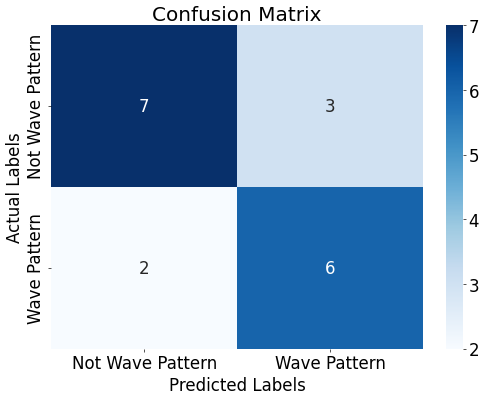

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch

def evaluate_model(model, dataloader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    # Print the classification report
    print(classification_report(all_labels, all_preds, target_names=list(class_names.values())))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

# Usage
# Assuming 'model', 'val_dataloader', 'device', and 'class_names' are already defined
class_names = {0: 'Not Wave Pattern', 1: 'Wave Pattern'}
evaluate_model(model, real_test_dataloader, device, class_names)


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import torch

def evaluate_model(model, dataloader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            print(f'outputs are {outputs}')
            _, preds = torch.max(outputs, 1)
            print(f'preds are {preds}')

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Compute the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    # Print the classification report
    print(classification_report(all_labels, all_preds, target_names=list(class_names.values())))

    # Plot the confusion matrix
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt="d", cmap='Blues', xticklabels=class_names.values(), yticklabels=class_names.values())
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.show()

# Usage
# Assuming 'model', 'val_dataloader', 'device', and 'class_names' are already defined
# class_names = {0: 'Not Wave Pattern', 1: 'Wave Pattern'}
# evaluate_model(wavepattern_model, real_test_dataloader, device, class_names)


In [ ]:
wavepattern_train_dataset.classes

['Wave Pattern', 'not_Wave Pattern']

outputs are tensor([[ 0.5305, -0.7145],
        [ 1.7564, -2.3731],
        [ 2.8417, -2.7862],
        [ 2.2000, -2.3741],
        [-0.2502,  0.2847],
        [ 1.3495, -1.0901],
        [ 0.0160, -0.0492],
        [-0.5622,  0.0305],
        [ 2.2323, -2.4358],
        [ 0.0450, -0.4752],
        [-1.9277,  1.3635],
        [ 0.4542, -0.3755]], device='cuda:0')
preds are tensor([0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
outputs are tensor([[-2.0904,  1.8933],
        [ 0.5070, -0.8715],
        [ 0.6872, -0.4874],
        [ 0.6852, -0.9856],
        [-2.9848,  2.3820],
        [ 0.1482, -0.3043]], device='cuda:0')
preds are tensor([1, 0, 0, 0, 1, 0], device='cuda:0')
                  precision    recall  f1-score   support

Not Wave Pattern       0.62      0.80      0.70        10
    Wave Pattern       0.60      0.38      0.46         8

        accuracy                           0.61        18
       macro avg       0.61      0.59      0.58        18
    weighted avg  

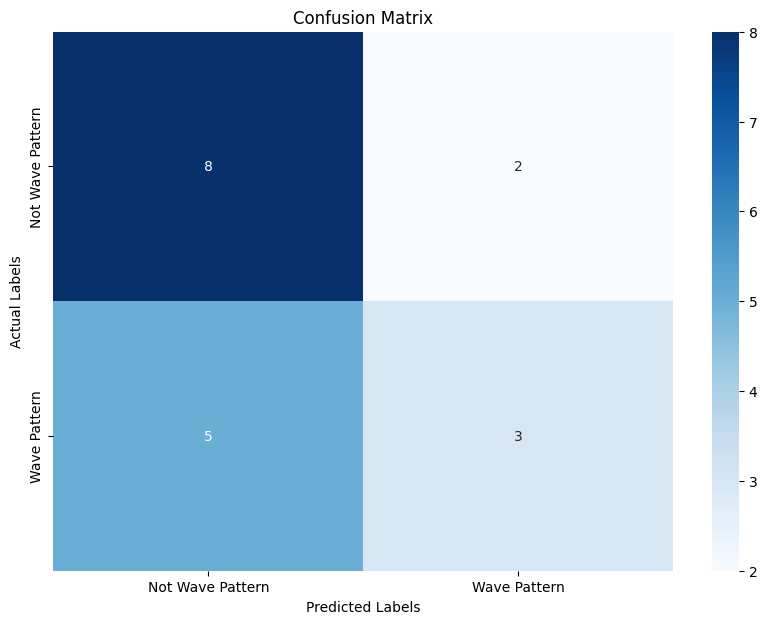

In [ ]:
class_names = {0: 'Not Wave Pattern', 1: 'Wave Pattern'}
evaluate_model(wavepattern_model, wavepattern_real_test_dataloader, device, class_names)


outputs are tensor([[ 0.5305, -0.7145],
        [ 1.7564, -2.3731],
        [ 2.8417, -2.7862],
        [ 2.2000, -2.3741],
        [-0.2502,  0.2847],
        [ 1.3495, -1.0901],
        [ 0.0160, -0.0492],
        [-0.5622,  0.0305],
        [ 2.2323, -2.4358],
        [ 0.0450, -0.4752],
        [-1.9277,  1.3635],
        [ 0.4542, -0.3755]], device='cuda:0')
preds are tensor([0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0], device='cuda:0')
outputs are tensor([[-2.0904,  1.8933],
        [ 0.5070, -0.8715],
        [ 0.6872, -0.4874],
        [ 0.6852, -0.9856],
        [-2.9848,  2.3820],
        [ 0.1482, -0.3043]], device='cuda:0')
preds are tensor([1, 0, 0, 0, 1, 0], device='cuda:0')
                  precision    recall  f1-score   support

Not Wave Pattern       0.62      0.80      0.70        10
    Wave Pattern       0.60      0.38      0.46         8

        accuracy                           0.61        18
       macro avg       0.61      0.59      0.58        18
    weighted avg  

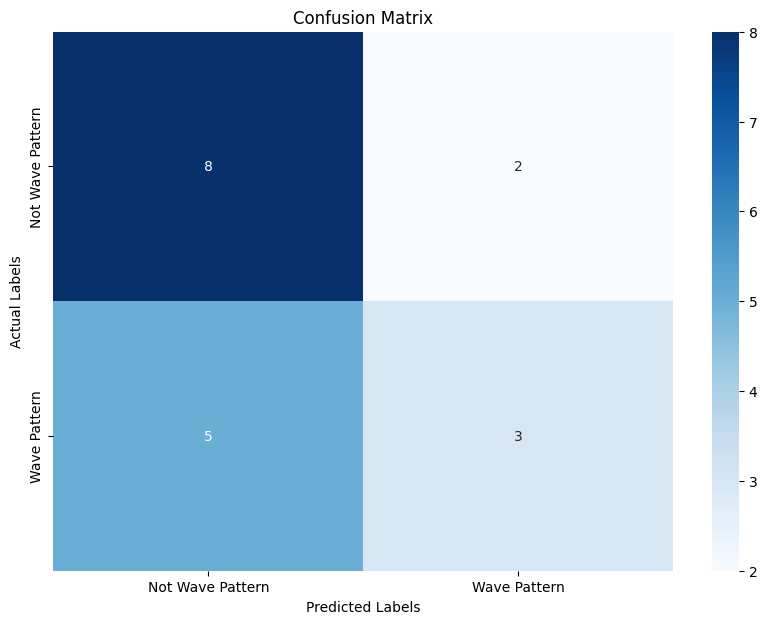

In [ ]:
class_names = {1: 'Not Wave Pattern', 0: 'Wave Pattern'}
evaluate_model(wavepattern_model, wavepattern_real_test_dataloader, device, class_names)


In [ ]:
save_path = '/content/drive/MyDrive/Satalite_Surf_Project/wavepattern_model/model_weights.pth'
torch.save(model.state_dict(), save_path)

In [ ]:
save_path = '/content/drive/MyDrive/Satalite_Surf_Project/wavepattern_model/model_weights_nosigmoid.pth'
torch.save(model.state_dict(), save_path)